In [1]:
#meta 6/6/2021 myCassava Image Classifier w/ TFHub Pre-Trained Model 
#Using pre-trained Cassava disease classification model 
#hybrid: (data) Kaggle competition + (code) Hub example Cropnet-Cassava
#ref
# src https://colab.research.google.com/github/tensorflow/hub/blob/master/examples/colab/cropnet_cassava.ipynb
# src code Github https://github.com/tensorflow/hub/blob/master/examples/colab/cropnet_cassava.ipynb

#input: Kaggle competition images 
#output: A probability vector of of 6 cassava classes

#previously in my-tfhub-image-classifier-cassava.ipynb
#6/3/2021 IMAGE CLASSIFIER w/PRETRAINED MODEL (SMALL SUBSET)
#     Predict on a small subset of train images (5%)
#     $error with more images: Your notebook tried to allocate more memory than is available
#     $todonext: figure out batches
#     Accuracy ~88.04%

#history
#6/6/2021 IMAGE CLASSIFIER w/PRETRAINED MODEL (W/ BATCHING)
#     Predict on a larger subset of train images (10%)
#     Split ds into batches,BS=128
#     Refer to: [Tensorflow 2.0] Load Pandas dataframe to Tensorflow
#     src https://financial-engineering.medium.com/tensorflow-2-0-load-pandas-dataframe-to-tensorflow-202c5d48966b
#     Accuracy ~88.27% 
#
#     Split ds into smaller batches,BS=64
#     Same Accuracy ~88.27% 

#6/20/2021 IMAGE CLASSIFIER w/PRETRAINED MODEL - PREDICT ON TEST DATA
#     Predict on test dataset
#     Prep for Kaggle submission - doesn't work with Internet enabled


#related ref
#src https://financial-engineering.medium.com/tensorflow-2-0-load-images-to-tensorflow-897b8b067fc2

In [2]:
# Copyright 2019 The TensorFlow Hub Authors. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================

# CropNet: Cassava Disease Detection

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/hub/tutorials/cropnet_cassava"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/hub/blob/master/examples/colab/cropnet_cassava.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/hub/blob/master/examples/colab/cropnet_cassava.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/hub/examples/colab/cropnet_cassava.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
  <td>
    <a href="https://tfhub.dev/google/cropnet/classifier/cassava_disease_V1/2"><img src="https://www.tensorflow.org/images/hub_logo_32px.png" />See TF Hub model</a>
  </td>
</table>

This notebook shows how to use the CropNet [cassava disease classifier](https://tfhub.dev/google/cropnet/classifier/cassava_disease_V1/2) model from **TensorFlow Hub**. The model classifies images of cassava leaves into one of 6 classes: *bacterial blight, brown streak disease, green mite, mosaic disease, healthy, or unknown*.

The original colab demonstrates how to:
 * Load the https://tfhub.dev/google/cropnet/classifier/cassava_disease_V1/2 model from **TensorFlow Hub**
 * Load the [cassava](https://www.tensorflow.org/datasets/catalog/cassava) dataset from **TensorFlow Datasets (TFDS)**
 * Classify images of cassava leaves into 4 distinct cassava disease categories or as healthy or unknown.
 * Evaluate the *accuracy* of the classifier and look at how *robust* the model is  when applied to out of domain images.
 
My code customizes the classifier to predict Cassava classes on Kaggle competition images.

## Imports and setup

In [3]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
#import tensorflow_datasets as tfds
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

#myImports
import os 
import json
import pandas as pd
from PIL import Image
from sklearn.model_selection import train_test_split

TF version: 2.4.1
Hub version: 0.12.0


In [4]:
#@title Helper function for displaying examples


#mine (refer to original in Xtra)
#display one image at a time
def my_plot(image, label):
    fig = plt.figure(figsize=(6,6))
    # Render the image
    ax = fig.add_subplot(111)
    ax.imshow(image, aspect='auto')
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    # Display the label and optionally prediction
    x_label = 'Label: ' + str(int(label))
    ax.set_xlabel(x_label)
    plt.show()
    
#display multiple images with predictions
def my_plot2(examples, predictions=None):
    
    # Get the images, labels, and optionally predictions
    for x in examples:
        images = x[0]
        labels = x[1]
    batch_size = BATCH_SIZE
    if predictions is None:
        predictions = batch_size * [None]
    
    # Configure the layout of the grid
    x = np.ceil(np.sqrt(batch_size))
    y = np.ceil(batch_size / x)
    fig = plt.figure(figsize=(x * 6, y * 7))
    
    for i, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
        # Render the image
        ax = fig.add_subplot(x, y, i+1)
        ax.imshow(image, aspect='auto')
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])

        # Display the label and optionally prediction
        x_label = 'Label: ' + target_map[str(int(label))]
        if prediction is not None:
            x_label = 'Prediction: ' + target_map[str(int(prediction))] + '\n' + x_label
            ax.xaxis.label.set_color('green' if label == prediction else 'red')
        ax.set_xlabel(x_label)
    
    plt.show()

In [5]:
#--my Constants and variables
DIR_ROOT = '../input/cassava-leaf-disease-classification/'
DIR_TRAIN = '../input/cassava-leaf-disease-classification/train_images/'
DIR_TEST = '../input/cassava-leaf-disease-classification/test_images/'

PREVIEW_SIZE = 5
BATCH_SIZE = 64
SEED = 24
IMAGE_SHAPE = (224, 224) # input dimensions required by the CNN model
IMAGE_RES = 224

## 0. myDataset

in Hub example: load the *cassava* dataset from TFDS  
my code: load data from Kaggle competition

- input: image files

In [6]:
# myList all files under the train directory
for train_dirname, _, train_filenames in os.walk(DIR_TRAIN):
    for train_filename in train_filenames[:5]:
        print(os.path.join(train_dirname, train_filename))

../input/cassava-leaf-disease-classification/train_images/1235188286.jpg
../input/cassava-leaf-disease-classification/train_images/1215607589.jpg
../input/cassava-leaf-disease-classification/train_images/478554372.jpg
../input/cassava-leaf-disease-classification/train_images/2763304605.jpg
../input/cassava-leaf-disease-classification/train_images/2826122413.jpg


- output: labels  
The *cassava* dataset has images of cassava leaves with 4 distinct diseases as well as healthy cassava leaves. The model can predict all of these classes as well as sixth class for "unknown" when the model is not confident in it's prediction.

In [7]:
#myLabels
with open((DIR_ROOT + '/label_num_to_disease_map.json')) as json_file:
    target_map = json.load(json_file)
    
# Extend the cassava dataset classes with 'unknown'
target_map['5']='Unknown'
print(target_map)

{'0': 'Cassava Bacterial Blight (CBB)', '1': 'Cassava Brown Streak Disease (CBSD)', '2': 'Cassava Green Mottle (CGM)', '3': 'Cassava Mosaic Disease (CMD)', '4': 'Healthy', '5': 'Unknown'}


- mapping of input and output

In [8]:
#train ds with image_id and labels
df_train = pd.read_csv(DIR_ROOT + '/train.csv')
print('train data\n', df_train.shape)
df_train.columns = ['image', 'label']
df_train.info()

train data
 (21397, 2)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21397 entries, 0 to 21396
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   21397 non-null  object
 1   label   21397 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 334.5+ KB


In [9]:
#$config - define a tiny subset 
#df_train = df_train[:50].copy()

#define a subset to predict on
df_train_all, df_train = train_test_split(df_train, test_size=0.10, random_state=SEED)
print(df_train_all.shape, df_train.shape)
df_train.head()

(19257, 2) (2140, 2)


,image,label
12322,3208046657.jpg,3
4128,1737140400.jpg,3
5128,1915645722.jpg,4
19409,624542244.jpg,2
15307,3750670092.jpg,3


In [10]:
#$config - a smaller subset 
#df_train = df_train[:50].copy()
#df_train.shape, df_train.head()

### 0.1 myEDA

In [11]:
#view an image example 
#Image.open(DIR_TRAIN + '1001723730.jpg')
#Image 1001723730 doesn't look healthy, but verified the label provided is accurate
#Image.open(DIR_TRAIN + '1001723730.jpg').resize(IMAGE_SHAPE)

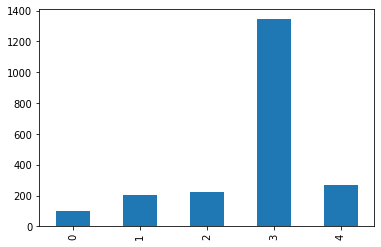

In [12]:
df_train['label'].value_counts().sort_index().plot(kind='bar');

## 1. myPreprocess
Before we can feed the data to the model, we need to do a bit of preprocessing. The model expects 224 x 224 images with RGB channel values in [0, 1]. Let's normalize and resize the images.

In [13]:
#mine (refer to original in Xtra)
#transform from an RGB image to tensor

#transform train images, return w/o label
def my_preprocess_fn(data):
    #print(data.__class__)
    #print(data)
    image_string = tf.io.read_file(DIR_TRAIN + data)
    image_decoded = tf.image.decode_jpeg(image_string, channels=3)
    # Normalize [0, 255] to [0, 1]
    image = tf.cast(image_decoded, tf.float32)
    image = image / 255.
    # Resize the images to 224 x 224
    image = tf.image.resize(image, IMAGE_SHAPE)
    
    return image

#transform test images, return w/o label $actodo
def my_preprocess_fn_test(data):
    #print(data.__class__)
    #print(data)
    image_string = tf.io.read_file(DIR_TEST + data)
    image_decoded = tf.image.decode_jpeg(image_string, channels=3)
    # Normalize [0, 255] to [0, 1]
    image = tf.cast(image_decoded, tf.float32)
    image = image / 255.
    # Resize the images to 224 x 224
    image = tf.image.resize(image, IMAGE_SHAPE)
    
    return image

#transform train images, return with label
def my_preprocess_fn2(data, label):
    #print(data.__class__)
    #print(data)
    image_string = tf.io.read_file(DIR_TRAIN + data[0])
    image_decoded = tf.image.decode_jpeg(image_string, channels=3)
    # Normalize [0, 255] to [0, 1]
    image = tf.cast(image_decoded, tf.float32)
    image = image / 255.
    # Resize the images to 224 x 224
    image = tf.image.resize(image, IMAGE_SHAPE)
    
    return image, label

#transform test images, return with label $actodo
def my_preprocess_fn2_test(data, label):
    #print(data.__class__)
    #print(data)
    image_string = tf.io.read_file(DIR_TEST + data[0])
    image_decoded = tf.image.decode_jpeg(image_string, channels=3)
    # Normalize [0, 255] to [0, 1]
    image = tf.cast(image_decoded, tf.float32)
    image = image / 255.
    # Resize the images to 224 x 224
    image = tf.image.resize(image, IMAGE_SHAPE)
    
    return image, label

### Load df to tf
src https://financial-engineering.medium.com/tensorflow-2-0-load-pandas-dataframe-to-tensorflow-202c5d48966b

In [14]:
#1 — Slice Data Frame
#First, in our data frame we have feature columns and one target column. So, we want to take the target column apart from the data frame then it is naturally sliced into two.
#print(df_train.shape)
target = df_train.pop('label')
target[:PREVIEW_SIZE]

12322    3
4128     3
5128     4
19409    2
15307    3
Name: label, dtype: int64

In [15]:
#feature column left
df_train[:PREVIEW_SIZE].values

array([['3208046657.jpg'],
       ['1737140400.jpg'],
       ['1915645722.jpg'],
       ['624542244.jpg'],
       ['3750670092.jpg']], dtype=object)

#### Build Tf.Dataset Train
The `from_tensor_slices` function can handle any structure of nested dictionaries or tuples. 

Example: The following code makes a dataset of (features_dict, labels) pairs:   https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/load_data/csv.ipynb#scrollTo=-ZC0rTpMZMZK

This code makes a dataset of tuples.

In [16]:
#2 — Combine the Pieces, using data struct tuple
dataset = tf.data.Dataset.from_tensor_slices((df_train.values, target.values)) #class tensorflow.python.data.ops.dataset_ops.TensorSliceDataset

In [17]:
# You can iterate over a tf.data.Dataset like any other python iterable:
# src https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/load_data/csv.ipynb#scrollTo=-ZC0rTpMZMZK

#here: tuple, not dict like above example
#for feat, targ in dataset:
for feat, targ in dataset.take(5):
    print ('Features: {}, Target: {}'.format(feat, targ)) #class 'tensorflow.python.framework.ops.EagerTensor'

Features: [b'3208046657.jpg'], Target: 3
Features: [b'1737140400.jpg'], Target: 3
Features: [b'1915645722.jpg'], Target: 4
Features: [b'624542244.jpg'], Target: 2
Features: [b'3750670092.jpg'], Target: 3


Let's take a look at a few examples from the dataset

In [18]:
#original
#batch = dataset['validation'].map(preprocess_fn).batch(25).as_numpy_iterator()
#examples = next(batch)
#plot(examples)

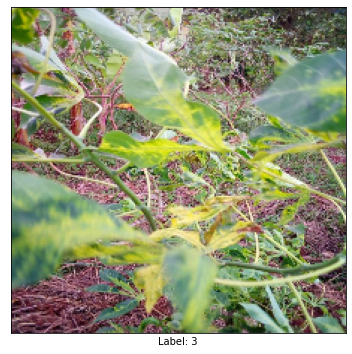

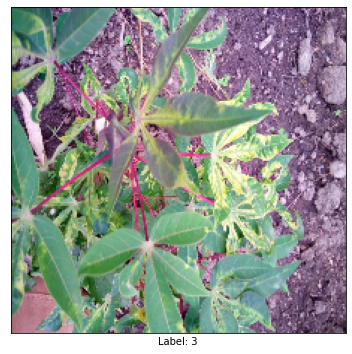

In [19]:
#mine
#fn my_plot: display one image at a time

for feature, target in dataset.take(2):
    #plot 
    my_plot(my_preprocess_fn(feature[0]), target)

### 1.2 Batch Preprocess

To train a model using this Dataset, you'll need to (skipped: shuffle and) batch the data.

#### With Iterator 
$note: works like without, cleaner tuple pieces

In [20]:
batch = dataset.map(my_preprocess_fn2).batch(BATCH_SIZE).as_numpy_iterator() #class tensorflow.python.data.ops.dataset_ops._NumpyIterator
#preview: in each batch look at some features and targets (class tf.Tensor)
for x,y in batch:
    print(x[0,2,2],y)

[0.57015806 0.64609843 0.18727489] [3 3 4 2 3 4 2 3 0 1 3 3 4 3 3 3 3 4 0 3 3 2 3 3 3 3 3 3 3 3 3 3 3 4 3 3 3
 3 1 3 3 3 4 3 3 3 3 3 3 3 3 3 3 4 1 3 4 3 3 3 3 3 3 2]
[0.20245099 0.4317227  0.2840236 ] [3 3 2 3 4 3 0 2 3 3 3 3 3 3 3 3 3 3 3 4 3 3 3 3 3 3 1 2 3 2 3 3 3 1 4 2 3
 3 3 3 4 3 4 3 2 3 3 4 2 2 1 3 3 3 1 3 4 4 3 3 1 3 0 3]
[0.19588834 0.4782413  0.22211884] [3 3 2 3 3 3 1 3 3 1 1 3 3 3 3 3 1 0 3 3 3 2 1 3 3 2 3 4 3 3 3 3 3 3 1 2 0
 3 3 3 3 3 1 2 3 3 3 2 2 3 1 1 3 0 3 1 3 1 2 2 3 4 3 0]
[0.17405963 0.4054322  0.18582433] [3 3 1 4 3 2 1 0 1 3 3 3 3 3 3 3 1 3 0 3 3 3 4 3 3 4 3 3 3 3 3 4 3 3 3 3 2
 4 1 4 3 4 3 4 3 1 3 0 3 3 2 3 2 1 3 3 3 3 3 3 4 3 3 2]
[1. 1. 1.] [3 3 4 3 2 1 1 3 3 2 3 2 3 1 3 3 0 3 1 3 3 3 0 3 3 3 2 4 3 1 3 4 3 1 3 4 4
 3 2 1 2 1 3 4 4 3 2 3 2 3 3 1 3 4 3 3 3 3 3 1 3 4 3 3]
[0.28586435 0.35422167 0.07512004] [3 3 4 3 3 2 3 0 3 3 2 3 3 3 3 1 3 3 2 2 0 2 4 3 2 3 3 2 2 3 3 3 3 3 3 3 3
 4 3 2 3 1 3 3 3 1 3 3 1 3 3 3 3 4 4 1 3 4 3 4 2 3 3 1]
[0.31887758 0.61054426 0.204

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:37: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.


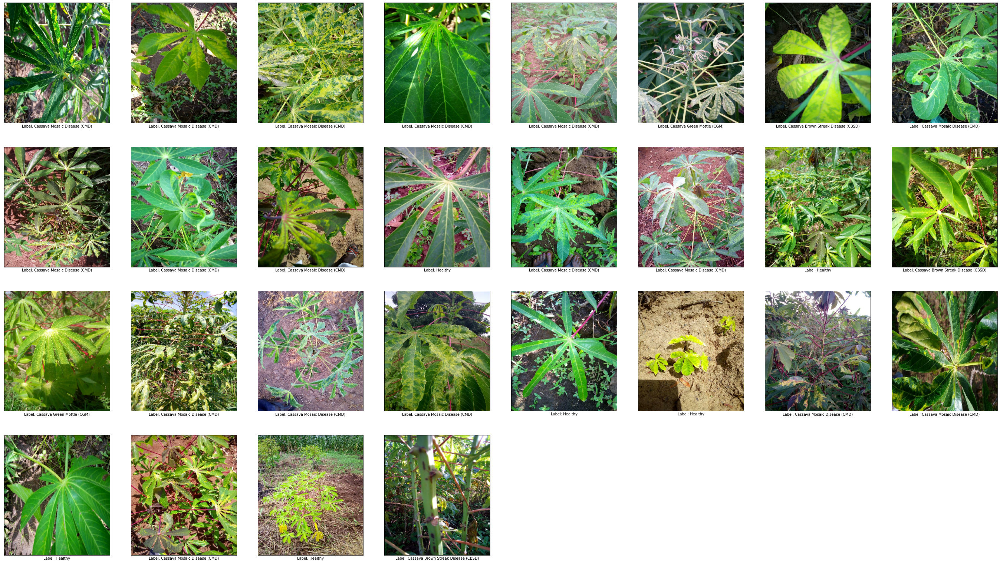

In [21]:
#display last batch: images and labels
#$note: plotting with or without Iterator works the same
batch = dataset.map(my_preprocess_fn2).batch(BATCH_SIZE)
my_plot2(batch)

## 2. myModel

Let's load the classifier from TF-Hub and get some predictions and see the predictions of the model is on a few examples

In [23]:
#load the classifier model from TFHub
URL = 'https://tfhub.dev/google/cropnet/classifier/cassava_disease_V1/2'
classifier = hub.KerasLayer(URL)
#classifier_test = hub.KerasLayer(URL, input_shape=(IMAGE_RES,IMAGE_RES,3))

In [24]:
#original
#probabilities = classifier(examples['image'])
#predictions = tf.argmax(probabilities, axis=-1)

#mine - iterate over batches
batch = dataset.map(my_preprocess_fn2).batch(BATCH_SIZE).as_numpy_iterator()
for x,y in batch:
    probabilities = classifier(x)
    predictions = tf.argmax(probabilities, axis=-1)
    
#show last batch
predictions

<tf.Tensor: shape=(28,), dtype=int64, numpy=
array([3, 3, 3, 3, 3, 2, 1, 3, 3, 3, 3, 4, 3, 2, 3, 4, 2, 3, 3, 3, 1, 4,
       3, 3, 4, 3, 4, 1])>

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:37: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.


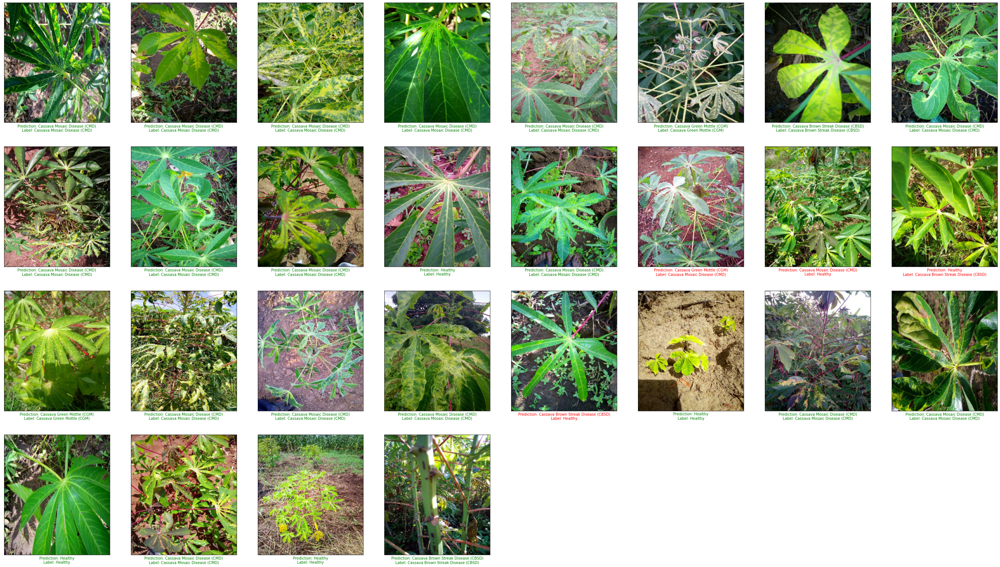

In [25]:
#display last batch: images, labels and predictions
#recreate same batch
batch = dataset.map(my_preprocess_fn2).batch(BATCH_SIZE).as_numpy_iterator()
my_plot2(batch, predictions)

### 2a. myEvaluation (skipped: robustness)

Let's measure the *accuracy* of our classifier on a split of the dataset. 

(skipped: We can also look at the *robustness* of the model by evaluating its performance on a non-cassava dataset. For image of other plant datasets like iNaturalist or beans, the model should almost always return *unknown*.)

In [26]:
#original: Calculate the accuracy of the model
#metric = tf.keras.metrics.Accuracy()
#for examples in ds:
#  probabilities = classifier(examples['image'])
#  predictions = tf.math.argmax(probabilities, axis=-1)
#  labels = examples['label']
#  metric.update_state(labels, predictions)

#print('Accuracy on %s: %.2f' % (dataset_description, metric.result().numpy()))

In [27]:
# myCalculate the accuracy of the model
metric = tf.keras.metrics.Accuracy()

#mine - iterate over all batches
batch = dataset.map(my_preprocess_fn2).batch(BATCH_SIZE).as_numpy_iterator()
for x,y in batch:
    probabilities = classifier(x)
    predictions = tf.argmax(probabilities, axis=-1)
    labels = y
    metric.update_state(labels, predictions)

print('Accuracy: %.4f' % (metric.result().numpy()))

Accuracy: 0.8827


## 3. Predict

In [28]:
#template
sample_submission = pd.read_csv(DIR_ROOT + 'sample_submission.csv')
submission = sample_submission.copy()
submission.head()

,image_id,label
0,2216849948.jpg,4


### 3a. Predict One Image
Test ds - only one file

['../input/cassava-leaf-disease-classification/test_images/2216849948.jpg']


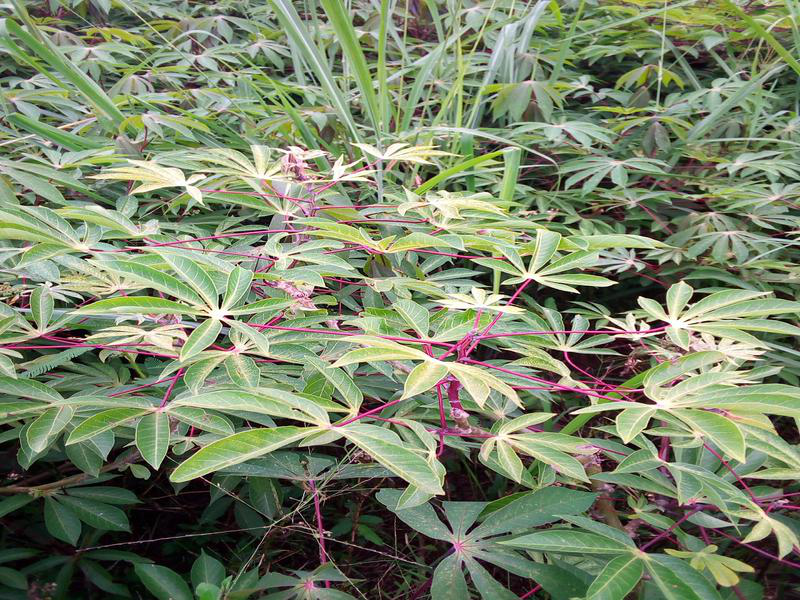

In [29]:
#view test images - only one
#test_img = get_image_files(path/'test_images')
#Image.open(test_img[0])

#create test images id
test_img_id = [os.path.join(DIR_TEST, x) for x in submission['image_id'].values]
print(test_img_id)
Image.open(test_img_id[0])

In [30]:
test_image = my_preprocess_fn_test(submission.loc[0,'image_id']) #class tensorflow.python.framework.ops.EagerTensor
test_image.shape

TensorShape([224, 224, 3])

In [31]:
#Predict on one image (in list)
probabilities = classifier(np.array([test_image])) #$note: list with one image
predictions = tf.argmax(probabilities, axis=-1)
probabilities, predictions

(<tf.Tensor: shape=(1, 6), dtype=float32, numpy=
 array([[3.3328047e-03, 1.5064593e-02, 7.5062132e-01, 1.1662795e-03,
         2.2981335e-01, 1.6655038e-06]], dtype=float32)>,
 <tf.Tensor: shape=(1,), dtype=int64, numpy=array([2])>)

### 3b. Predict on Test Data
Predict on real test ds

#### Build Tf.Dataset Test

In [32]:
target_test = submission.pop('label')
submission.values

array([['2216849948.jpg']], dtype=object)

Features: [b'2216849948.jpg']


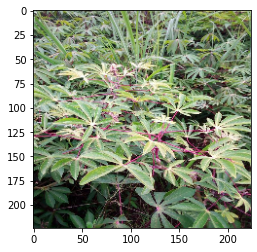

In [33]:
dataset_test = tf.data.Dataset.from_tensor_slices((submission.values, target_test)) #$note: no targets really  #class tensorflow.python.data.ops.dataset_ops.TensorSliceDataset

#for feat, targ in dataset_test.take(1):
#    print ('Features: {}, Target: {}'.format(feat, targ)) #class 'tensorflow.python.framework.ops.EagerTensor'
    
for feat, targ in dataset_test.take(1):
    print ('Features: {}'.format(feat)) #class 'tensorflow.python.framework.ops.EagerTensor'
    plt.imshow(my_preprocess_fn_test(feat[0])) #, aspect='auto'

In [34]:
#troubleshoot shapes
dataset, dataset_test

(<TensorSliceDataset shapes: ((1,), ()), types: (tf.string, tf.int64)>,
 <TensorSliceDataset shapes: ((1,), ()), types: (tf.string, tf.int64)>)

In [35]:
#BATCH_SIZE_TEST = 1
batch_test = dataset_test.map(my_preprocess_fn2_test).batch(BATCH_SIZE).as_numpy_iterator() #class tensorflow.python.data.ops.dataset_ops._NumpyIterator
#preview: in each batch look at some features and targets (class tf.Tensor)
for x,y in batch_test:
    print(x[0,2,2])

[0.85394156 0.8692077  0.8691777 ]


Predict on test image(s) in batch(es)

In [36]:
preds = []

#mine - iterate over batches
batch_test = dataset_test.map(my_preprocess_fn2_test).batch(BATCH_SIZE).as_numpy_iterator()
for x,y in batch_test:
    probabilities = classifier(x)
    predictions = tf.argmax(probabilities, axis=-1)
    preds.append(np.array(predictions))
    
#show last batch
predictions

<tf.Tensor: shape=(1,), dtype=int64, numpy=array([2])>

In [37]:
#add predictions to submission
submission['label'] = np.concatenate( preds, axis=0 )
submission.head()

,image_id,label
0,2216849948.jpg,2


## 4. Submit to Kaggle

In [38]:
#save to csv
submission.to_csv('submission.csv', index=False)

## Learn more

* Learn more about the model on TensorFlow Hub: https://tfhub.dev/google/cropnet/classifier/cassava_disease_V1/2
* Learn how to build a custom image classifier running on a mobile phone with [ML Kit](https://developers.google.com/ml-kit/custom-models#tfhub) with the [TensorFlow Lite version of this model](https://tfhub.dev/google/lite-model/cropnet/classifier/cassava_disease_V1/1).

## Xtra

In [39]:
mystop

NameError: name 'mystop' is not defined

In [ ]:
#$xtra
#example: titanic_batches = titanic_ds.shuffle(len(titanic_labels)).batch(32)
batch = dataset.map(my_preprocess_fn2).batch(BATCH_SIZE) #class tensorflow.python.data.ops.dataset_ops.BatchDataset
#better code: $note: works like without, cleaner tuple pieces
##batch = dataset.map(my_preprocess_fn2).batch(BATCH_SIZE).as_numpy_iterator() #class tensorflow.python.data.ops.dataset_ops._NumpyIterator

#preview: in each batch look at some features and targets (class tf.Tensor)
for x,y in batch:
    print(x[0,2,2],y)

In [ ]:
#$xtra
#display multiple images, no predictions
def my_plot2(examples):
    for x in examples:
        images = x[0]
        labels = x[1]
  
    # Get the images, labels, and optionally predictions
    batch_size = BATCH_SIZE
    
    # Configure the layout of the grid
    x = np.ceil(np.sqrt(batch_size))
    y = np.ceil(batch_size / x)
    fig = plt.figure(figsize=(x * 6, y * 7))
    
    for i, (image, label) in enumerate(zip(images, labels)):
        # Render the image
        ax = fig.add_subplot(x, y, i+1)
        ax.imshow(image, aspect='auto')
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])

        # Display the label and optionally prediction
        x_label = 'Label: ' + target_map[str(int(label))]
        ax.set_xlabel(x_label)
    
    plt.show()


In [ ]:
#$xtra
#original fns

def plot(examples, predictions=None):
  # Get the images, labels, and optionally predictions
  images = examples['image']
  labels = examples['label']
  batch_size = len(images)
  if predictions is None:
    predictions = batch_size * [None]

  # Configure the layout of the grid
  x = np.ceil(np.sqrt(batch_size))
  y = np.ceil(batch_size / x)
  fig = plt.figure(figsize=(x * 6, y * 7))

  for i, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    # Render the image
    ax = fig.add_subplot(x, y, i+1)
    ax.imshow(image, aspect='auto')
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])

    # Display the label and optionally prediction
    x_label = 'Label: ' + name_map[class_names[label]]
    if prediction is not None:
      x_label = 'Prediction: ' + name_map[class_names[prediction]] + '\n' + x_label
      ax.xaxis.label.set_color('green' if label == prediction else 'red')
    ax.set_xlabel(x_label)

  plt.show()

def preprocess_fn(data):
  image = data['image']

  # Normalize [0, 255] to [0, 1]
  image = tf.cast(image, tf.float32)
  image = image / 255.

  # Resize the images to 224 x 224
  image = tf.image.resize(image, (224, 224))

  data['image'] = image
  return data



In [ ]:
#$xtra
#my transform from an RGB image to tensor, takes image path as param
def parse_image(file_path):
    image_string = tf.io.read_file(file_path)
    image_decoded = tf.image.decode_jpeg(image_string, channels=3)
    #resize ref https://www.tensorflow.org/api_docs/python/tf/image/resize
    image = tf.image.resize(image_decoded, (IMAGE_RES,IMAGE_RES)) #, method='nearest'
    #normalize 
    image = image/255.0
    image = tf.cast(image, tf.float32)
    return image
